# Basic notions for studying fluids mechanics

* Emmanuel Cosme, August 2020

This notebook aims at illustrating some basic notions essential for the study of fluids mechanics:

* scalar fields and vector fields
* Differential operators: gradient, divergence, rotational
* lagrangian and eulerian viewpoints of transport

The theme is influenced by ocean dynamics. No need to know about these aspects to catch the essentials.

Understanding the python code is not essential to focus on theoretical notions and illustrations. However, sometimes the code helps understanding the theory.


## 0. Import standard python modules and define useful functions locally

### 0.1 Modules

In [1]:
import numpy as np
from scipy.interpolate import griddata

import matplotlib.pyplot as plt
import matplotlib.animation
%matplotlib inline

### 0.2 Functions

These functions implements the differential operators.

In [53]:
def set_boundaries_to_zero(field):
    f = np.copy(field)
    f[0,:]  = f[-1,:] = f[:,0]  = f[:,-1] = 0
    return f

def von_neuman_euler(field, axis=None):
    """Apply Von Neuman boundary conditions to the field."""
    f = np.copy(field)
    if axis is 0 or None:
        f[0,:]  = f[1,:]
        f[-1,:] = f[-2,:]
    if axis is 1 or None:
        f[:,0]  = f[:,1]
        f[:,-1] = f[:,-2]
    return f

#def von_neuman_leapfrog(field):
#    """Apply Von Neuman boundary conditions to the field."""
#    f = np.copy(field)
#    f[0,:]  = f[2,:] + f[1,:] - f[3,:]
#    f[-1,:] = f[-2,:] + f[-3,:] - f[-4,:]
#    f[:,0]  = f[:,2] + f[:,1] - f[:,3]
#    f[:,-1] = f[:,-2] + f[:,-3] - f[:,-4]
#    return f

#def von_neuman(field):
#    return von_neuman_leapfrog(field)

def derivative(field, axis=0):
    """Compute partial derivative along given axis using second-order centered scheme."""
    f = 0.5*( np.roll(field, -1, axis=axis) - np.roll(field, 1, axis=axis) )
    f = von_neuman_euler(f, axis=axis)
    return f

def gradient(field):
    """Compute gradient of input scalar field."""
    fx, fy = derivative(field, axis=0), derivative(field, axis=1)
    return fx, fy

def divergence(u, v):
    """Compute divergence of a 2D-vector with components u, v."""
    f = derivative(u, axis=0) + derivative(v, axis=1)
    return f

def rotational(u, v):
    """Compute vertical component of rotational of a 2D-vector with components u, v."""
    f = derivative(v, axis=0) - derivative(u, axis=1)
    return f

def laplacian(field):
    """Compute Laplacian of field."""
    fx = np.roll(field, -1, axis=0) -2 * field + np.roll(field, 1, axis=0)
    fy = np.roll(field, -1, axis=1) -2 * field + np.roll(field, 1, axis=1)
    f = fx + fy
    f = von_neuman_euler(f)
    return f
    

## 1. Study of a scalar field: Sea Level Anomaly (SLA)

SLA is the anomaly of sea level with respect to the level averaged over a long time. SLA represents the variations of Sea Level due to dynamical processes (currents in particular). The equivalent quantity in the atmosphere is surface pressure anomaly, that is the deviation of pressure from the average 1013 hPa. 

### 1.1. Creation and first look at SLA
Here we create a 2-dimensional, rectangular, horizontal domain typically covering a small fraction of the ocean. We create a "synthetic" (not real), normalized SLA field displaying cyclonic and anticyclonic eddies. We plot this SLA field.

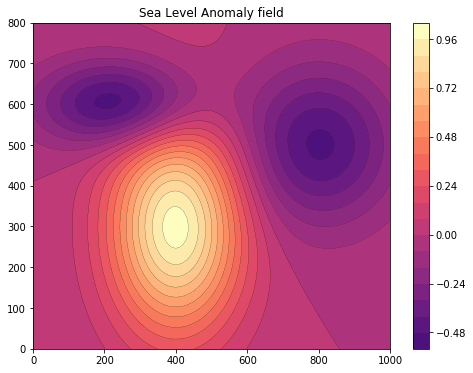

In [7]:
Nx, Ny = 100, 80    # Number of grid points in the domain
x=np.arange(0,Nx+1)*10#/Nx    # Zonal coordinate in km
y=np.arange(0,Ny+1)*10#8/Ny     # Meridional coordinate in km
dx, dy = x[1]-x[0], y[1]-y[0]   # grid mesh size (regular) in km

def make_sla(x,y):
    """Create a 2D field with arbitrary analytical functions"""
    x,y = x/100, y/100
    a = 0.6*(x-4)**2 + 0.3*(y-3)**2
    b = 0.45*(x-8)**2 + 0.55*(y-5)**2
    d = 0.2*(x-2.5)**2 + 0.9*(y-6)**2
    c = np.exp(-a/2)-0.5*np.exp(-b/2)-0.6*np.exp(-d)
    c /= np.max(c)
    return c

ym, xm = np.meshgrid(y,x)
sla = make_sla(xm,ym)
# Plot
vmin, vmax = -1, 1
plt.figure(figsize=(8, 6))
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, sla, 20, vmin=vmin, vmax=vmax, cmap = "magma")
plt.title(label = "Sea Level Anomaly field")
plt.colorbar()

### Challenge 1

* What are the values of SLA at coordinates (400, 300)? (800, 300)? (400, 700)?
* Do you agree that SLA varies with both $x$ and $y$ coordinates and can be written SLA($x,y$)?

### 1.2. Computing the gradient of SLA

Here we compute the gradient of SLA:

In [8]:
gradx_sla, grady_sla = gradient(sla)

Let's plot this vector field over the SLA (scalar) field:

Text(0.5, 1.0, 'Gradient of SLA')

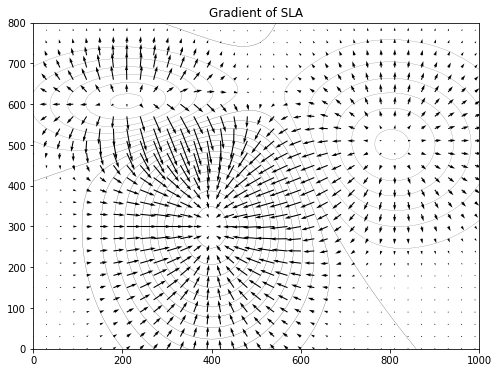

In [9]:
plt.figure(figsize=(8, 6))
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
slsp = 3  # slicing step
plt.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], gradx_sla[::slsp,::slsp], grady_sla[::slsp,::slsp], color="k")
plt.title(label = "Gradient of SLA")

### Challenge 2

* What are the thin black lines on this plot?
* What are the arrows?
* How are lines and arrows positioned with respect to each other?
* How do you connect the length of vectors with lines?

## 2. Study of a vector field: geostrophic velocity

In the ocean, geostrophic velocity (current speed) is defined as (with a few approximations not detailed here):
$$ u = - \frac{g}{f} \frac{\partial SLA}{\partial y}, \quad v = \frac{g}{f} \frac{\partial SLA}{\partial x} $$
where $g$ is gravity and $f$ the Coriolis factor, taken here at $10^{-4}$. $u$ represents the zonal (West to East) component of velocity, $v$ represents the meridional component (South to North). The components of geostrophic velocity are computed below and expressed in m/s. We also compute the absolute velocity.

In [10]:
u_geos = - 10/1e-4/1000 * derivative(sla, axis=1)
v_geos =   10/1e-4/1000 * derivative(sla, axis=0)
absuv  = np.sqrt( u_geos*u_geos + v_geos*v_geos )

### 2.1. A look at velocity

We plot $u$, $v$, absolute velocity and velocity vectors:

Text(0.5, 1.0, 'Velocity vector field')

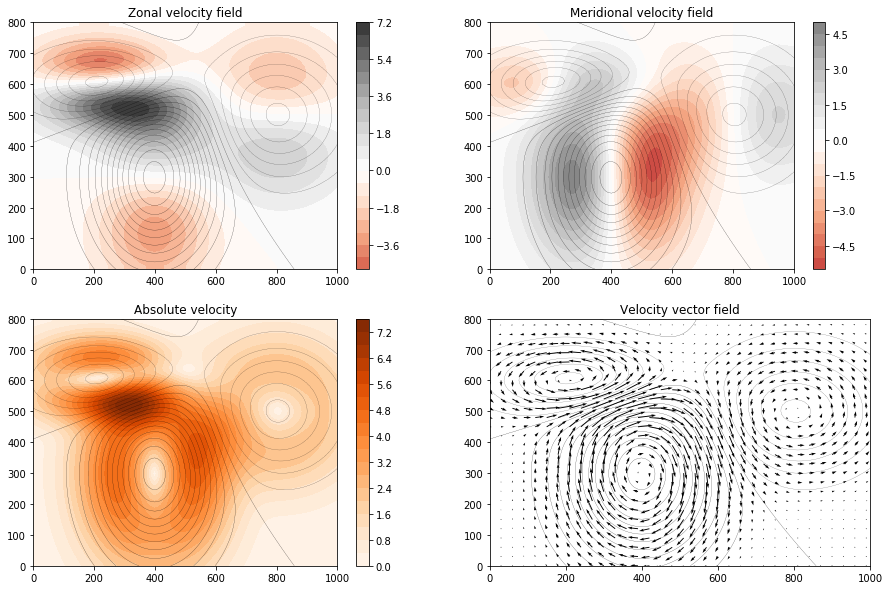

In [11]:
# Plot
vmin, vmax = -8, 8
plt.figure(figsize=(15, 10))

plt.subplot(221)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, u_geos, 20, vmin=vmin, vmax=vmax, cmap = "RdGy")
plt.title(label = "Zonal velocity field")
plt.colorbar()

plt.subplot(222)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, v_geos, 20, vmin=vmin, vmax=vmax, cmap = "RdGy")
plt.title(label = "Meridional velocity field")
plt.colorbar()

plt.subplot(223)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, absuv, 20, cmap = "Oranges")
plt.title(label = "Absolute velocity")
plt.colorbar()

plt.subplot(224)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
slsp = 3  # slicing step
plt.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])
plt.title(label = "Velocity vector field")

### Challenge 3

* At $x$=400, meridional velocity exhibits 0 values separating a grey and a red blob. How do you connect this 0 value with SLA?
* Where is the maximum of absolute velocity? How do you connect this with SLA?
* Is this maximum mainly due to zonal or meridional velocity?
* How would you describe the SLA variations there?
* How are velocity vectors and SLA contours positioned with respect to each other?
* Compare the velocity field and the SLA gradient field. Can you base your observation on mathematical evidence?


### 2.2. Divergence and rotational of velocity

We compute and plot divergence and rotational of velocity, also called vorticity:

In [12]:
divuv = divergence(u_geos, v_geos)
vort = rotational(u_geos, v_geos)

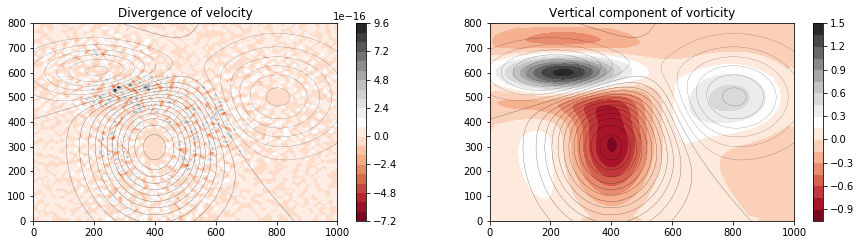

In [13]:
# Plot
plt.figure(figsize=(15, 8))

plt.subplot(221)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, divuv, 20, cmap = "RdGy")
plt.title(label = "Divergence of velocity")
plt.colorbar()

plt.subplot(222)
plt.contour(xm, ym, sla, 20, colors='black', linewidths = 0.2)
plt.contourf(xm, ym, vort, 20, cmap = "RdGy")
plt.title(label = "Vertical component of vorticity")
plt.colorbar()

### Challenge 4

* What is the order of magnitude of velocity divergence? Is the pattern somehow physically meaningful?
* Connect your previous observation with mathematical evidence by hand-computing the divergence of geostrophic velocity.
* Why do you only care about the vertical component of vorticity here?
* Where are the maxima and minima of vorticity, with respect to SLA?
* Can you formulate a mathematical interpretation of the previous observation?

## 3. Transport of tracers: Eulerian approach

A particle is introduced somewhere in the domain and transported by the flow. The numerical scheme used here requires a bilinear interpolation of the velocity fields, see this: <https://fr.wikipedia.org/wiki/Interpolation_bilin%C3%A9aire>

In [36]:
Initial_location = np.array([250,50])     # Set initial position of particle
dt = 20                                   # time step
Nt = 30                                   # Number of time steps

tracer_pos = Initial_location             # Initialize position
pos_series = np.empty((2,Nt+1))           # To store results for plots
pos_series[:,0] = tracer_pos

# Time evolution
for it in range(Nt):
    ix, iy = np.searchsorted(x,tracer_pos[0]), np.searchsorted(y,tracer_pos[1])
    ix, iy = np.clip(ix, 0, Nx-1), np.clip(iy, 0, Ny-1)
    ddx, ddy = (tracer_pos[0]-x[ix])/dx, (tracer_pos[1]-y[iy])/dy  # See wikipedia reference to understand this...
    u_int = u_geos[ix,iy] \
          + ddx * (u_geos[ix+1,iy] - u_geos[ix,iy]) \
          + ddy * (u_geos[ix,iy+1] - u_geos[ix,iy]) \
          + ddx*ddy * (u_geos[ix,iy] + u_geos[ix+1,iy+1] - u_geos[ix+1,iy] - u_geos[ix+1,iy])
    v_int = v_geos[ix,iy] \
          + ddx * (v_geos[ix+1,iy] - v_geos[ix,iy]) \
          + ddy * (v_geos[ix,iy+1] - v_geos[ix,iy]) \
          + ddx*ddy * (v_geos[ix,iy] + v_geos[ix+1,iy+1] - v_geos[ix+1,iy] - v_geos[ix+1,iy])
    tracer_pos = tracer_pos + np.array([u_int*dt, v_int*dt])
    pos_series[:,it+1] = tracer_pos

And the result is plotted (click of appropriate button to animate):

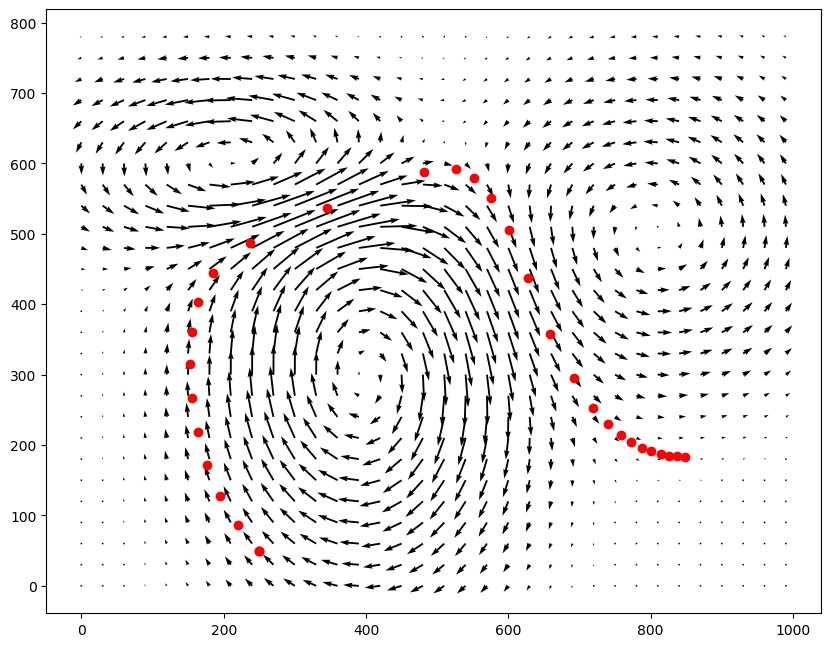

In [37]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 100  
plt.ioff()
fig, ax = plt.subplots(figsize=(10,8))
slsp = 3  # slicing step
q = ax.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])
#ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             #label='Quiver key, length = 10', labelpos='E')

def animate(t):
    ax.scatter(pos_series[0,t], pos_series[1,t], c='r')

matplotlib.animation.FuncAnimation(fig, animate, frames=Nt)

### Challenge 5

* Can you explain what the red dots represent exactly?
* How is the particle trajectory related to the velocity field?
* How comes that two consecutive positions are distant from each other around $x$=300, and close to each other around $x$=800?
* Have fun! Change the particle initial position (try (400, 300) for example) and make bets about the final position...
* How would you represent the particle position mathematically?

Beyond the scope of this notebook: play with the time step to illustrate numerical instabilities. Try $dt$=60 for example (and explain what happens, and why).

## 4. Transport of tracers: Eulerian approach

In the Eulerian approach, the tracers are not represented by particles (Lagrangian approach), but by a concentration field. Below, we create a synthetic, initial concentration field, then have it transported by the flow.

In [116]:
Initial_location = np.array([250,50])
dt = 20    # time step
Nt = 30   # Number of time step

# Make initial concentration field
def make_initial_conc(x,y):
    """Create an initial concentration field"""
    a = ( (x-Initial_location[0])**2 + (y-Initial_location[1])**2) *0.8e-4
    c = np.exp(-a/2)
    c /= np.max(c)
    #c = set_boundaries_to_zero(c)
    return c
conc = make_initial_conc(xm, ym)
conc_series = np.empty((Nx+1,Ny+1,Nt+1))
conc_series[:,:,0] = conc

# And compute advection with a semi-lagrangian scheme
for it in range(Nt):
    xm_, ym_ = xm-u_geos*dt, ym-v_geos*dt
    conc = griddata((xm.flatten(),ym.flatten()), conc.flatten(), (xm_,ym_), method='linear')
    # Manage boundaries (no flux of tracers)
    p, q = np.where(xm_<xm.min()), np.where(xm_>xm.max())
    conc[p] = conc[q] = 0.
    p, q = np.where(ym_<ym.min()), np.where(ym_>ym.max())
    conc[p] = conc[q] = 0.
    
    conc_series[:,:,it+1] = conc

And the result is plotted. Click on the appropriate button to animate:

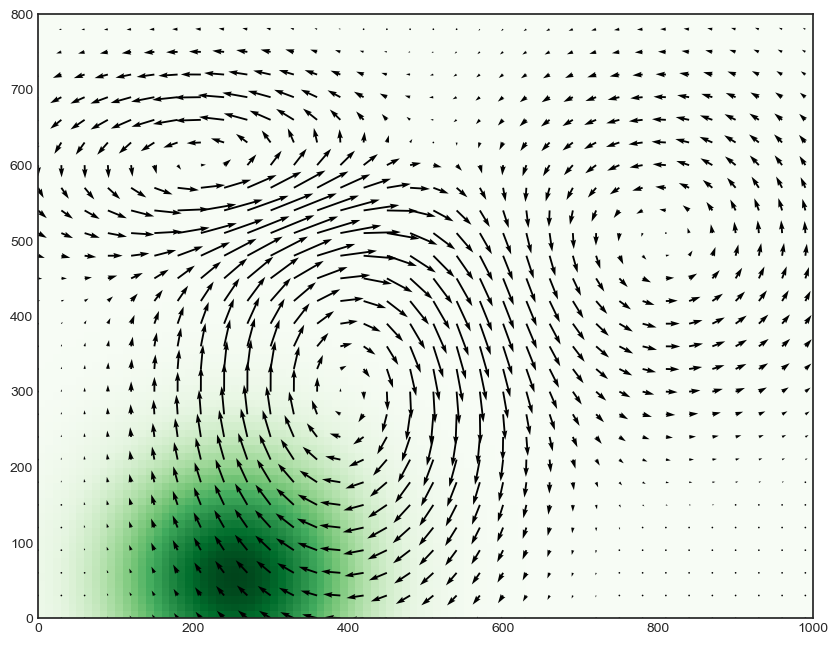

In [117]:
plt.style.use('seaborn-white')
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 100  
plt.ioff()
fig, ax = plt.subplots(figsize=(10,8))
slsp = 3  # slicing step
vmin, vmax = 0, 1

def animate(t):
    #ax.contourf(xm,ym,conc_series[:,:,t], 20, cmap='RdGy')
    ax.pcolormesh(xm,ym,conc_series[:,:,t],cmap ='Greens', vmin = vmin, vmax = vmax)
    q = ax.quiver(xm[::slsp,::slsp], ym[::slsp,::slsp], u_geos[::slsp,::slsp], v_geos[::slsp,::slsp])
    #ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             #label='Quiver key, length = 10', labelpos='E')


matplotlib.animation.FuncAnimation(fig, animate, frames=Nt)

### Challenge 6

* Can you explain what the green colors represent exactly?
* How would you represent the tracer concentration mathematically?
* The initial concentration field exhibits a circular pattern. What creates the deformation of this pattern during the transport?